### author by yangshichen
### 注意：脚本仅供参考，使用前请仔细阅读

### 调用GPU

In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import seaborn as sb
from matplotlib.pyplot import rc_context
import matplotlib.pyplot as plt
import rapids_singlecell as rsc
from scipy.io import mmread
from scipy.sparse import csr_matrix
import cupy as cp
import matplotlib as mpl
mpl.rcParams['pdf.fonttype'] = 42
import scrublet as scr

import warnings
warnings.filterwarnings("ignore")

In [2]:
import rmm
rmm.reinitialize(managed_memory=True)
#cp.cuda.set_allocator(rmm.rmm_cupy_allocator)

In [3]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=100, frameon=False)
sc._settings.ScanpyConfig.n_jobs=70

scanpy==1.9.6 anndata==0.10.3 umap==0.5.5 numpy==1.24.4 scipy==1.11.4 pandas==1.5.3 scikit-learn==1.3.2 statsmodels==0.14.0 igraph==0.10.8 pynndescent==0.5.11


In [4]:
cluster_cols = ["#DC050C", "#FB8072", "#1965B0", "#7BAFDE", "#882E72", 
                "#B17BA6", "#FF7F00", "#FDB462", "#E7298A", "#E78AC3", 
                "#33A02C", "#B2DF8A", "#55A1B1", "#8DD3C7", "#A6761D", 
                "#E6AB02", "#7570B3", "#BEAED4", "#666666", "#999999", 
                "#aa8282", "#d4b7b7", "#8600bf", "#ba5ce3", "#808000", 
                "#aeae5c", "#1e90ff", "#00bfff", "#56ff0d", "#ffff00"]

### 聚类分群

In [5]:
adata = sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/NK_filter.h5ad")
adata.X = adata.layers['counts'].copy()
adata

AnnData object with n_obs × n_vars = 204859 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'leiden_r2.0_n2', 'celltype_L1', 'phase_ordered', 'leiden_r5.0_n2'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    layers: 'counts'

In [6]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata,batch_key="stage")
adata.var.highly_variable.value_counts()

normalizing counts per cell
    finished (0:00:20)
extracting highly variable genes
    finished (0:00:10)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


False    17688
True      3991
Name: highly_variable, dtype: int64

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:01:58)


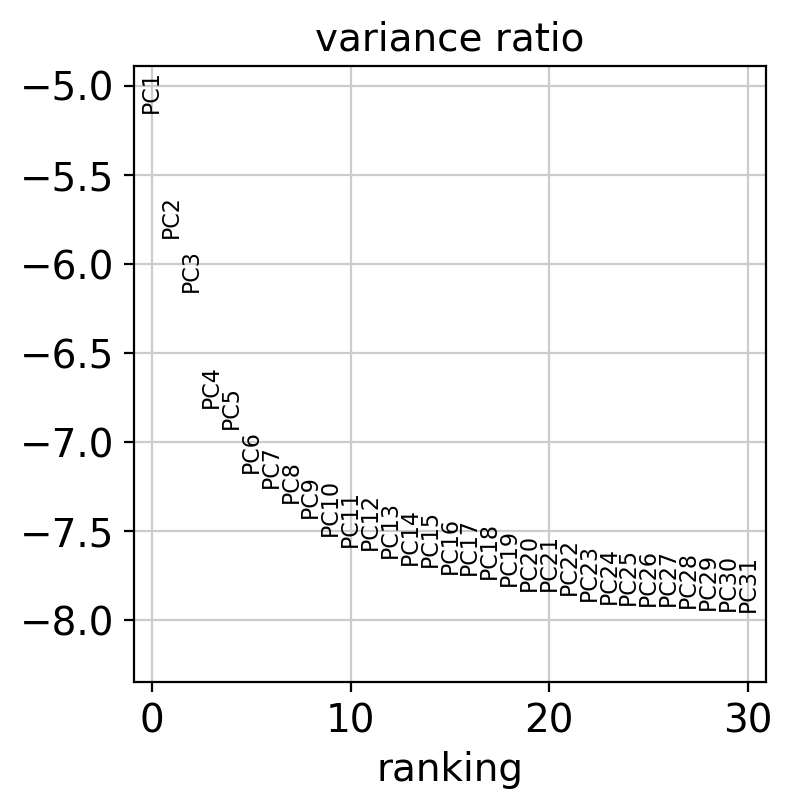

In [7]:
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver='arpack',n_comps=50,use_highly_variable=True)
sc.pl.pca_variance_ratio(adata,n_pcs=30,log=True)

In [8]:
rsc.pp.harmony_integrate(adata,key='sample',max_iter_harmony = 30)

2024-05-15 14:25:12,779 - harmonypy_gpu - INFO - Iteration 1 of 30
2024-05-15 14:25:44,834 - harmonypy_gpu - INFO - Iteration 2 of 30
2024-05-15 14:26:17,139 - harmonypy_gpu - INFO - Converged after 2 iterations


In [26]:
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=13, use_rep='X_pca_harmony')
sc.tl.umap(adata,min_dist = 0.5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:57)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:07:20)


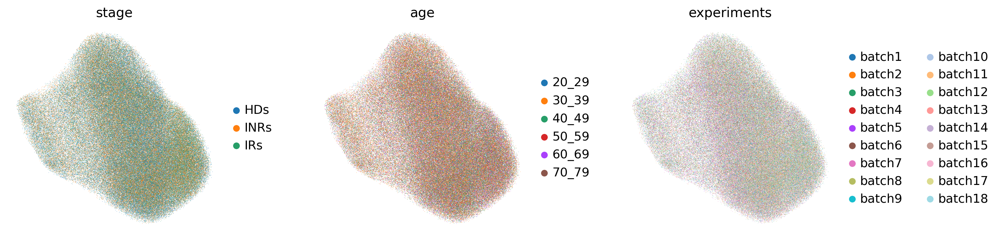

In [27]:
sc.pl.umap(adata, color=['stage', 'age', 'experiments'], wspace=0.3)

running Leiden clustering


IOStream.flush timed out


    finished: found 15 clusters and added
    'leiden_r1.8_n2', the cluster labels (adata.obs, categorical) (0:01:14)


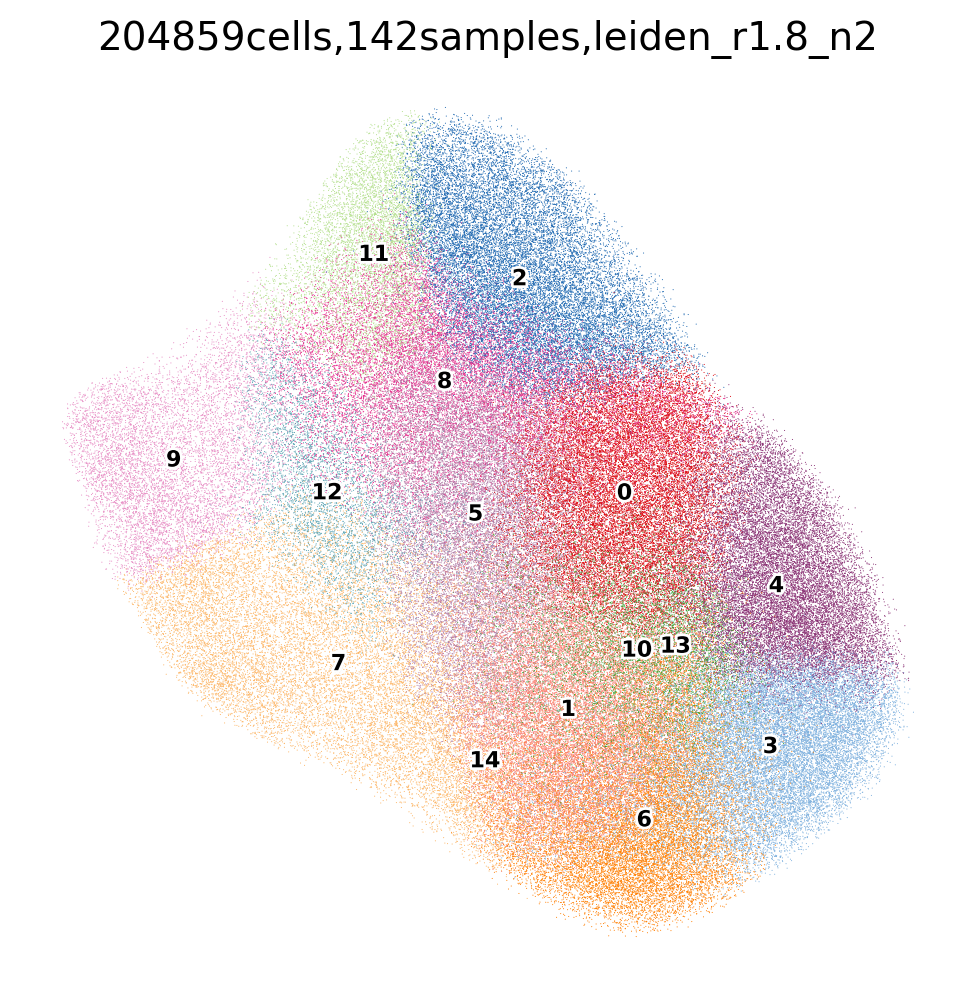

In [28]:
sc.tl.leiden(adata,resolution=1.8,n_iterations=2,key_added='leiden_r1.8_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r1.8_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='204859cells,142samples,leiden_r1.8_n2')

running Leiden clustering
    finished: found 17 clusters and added
    'leiden_r2.0_n2', the cluster labels (adata.obs, categorical) (0:00:54)


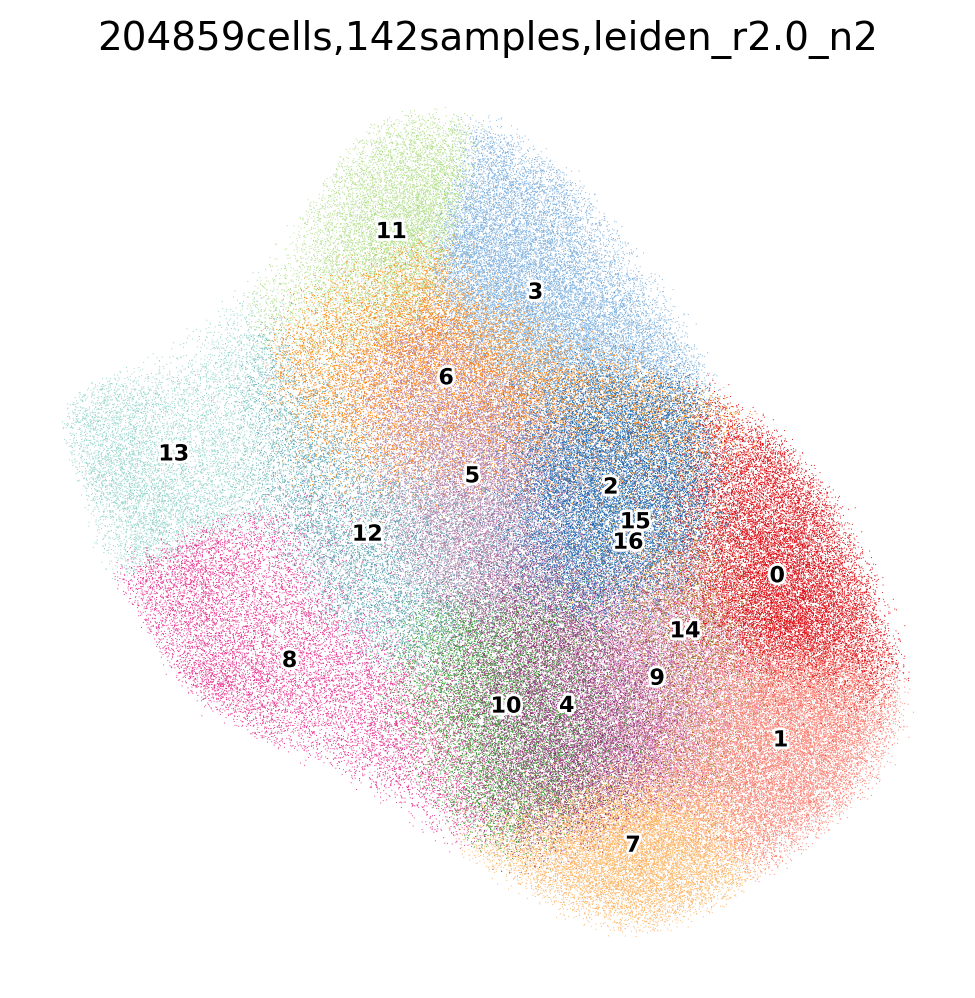

In [29]:
sc.tl.leiden(adata,resolution=2.0,n_iterations=2,key_added='leiden_r2.0_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r2.0_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='204859cells,142samples,leiden_r2.0_n2')

running Leiden clustering
    finished: found 19 clusters and added
    'leiden_r2.2_n2', the cluster labels (adata.obs, categorical) (0:00:53)


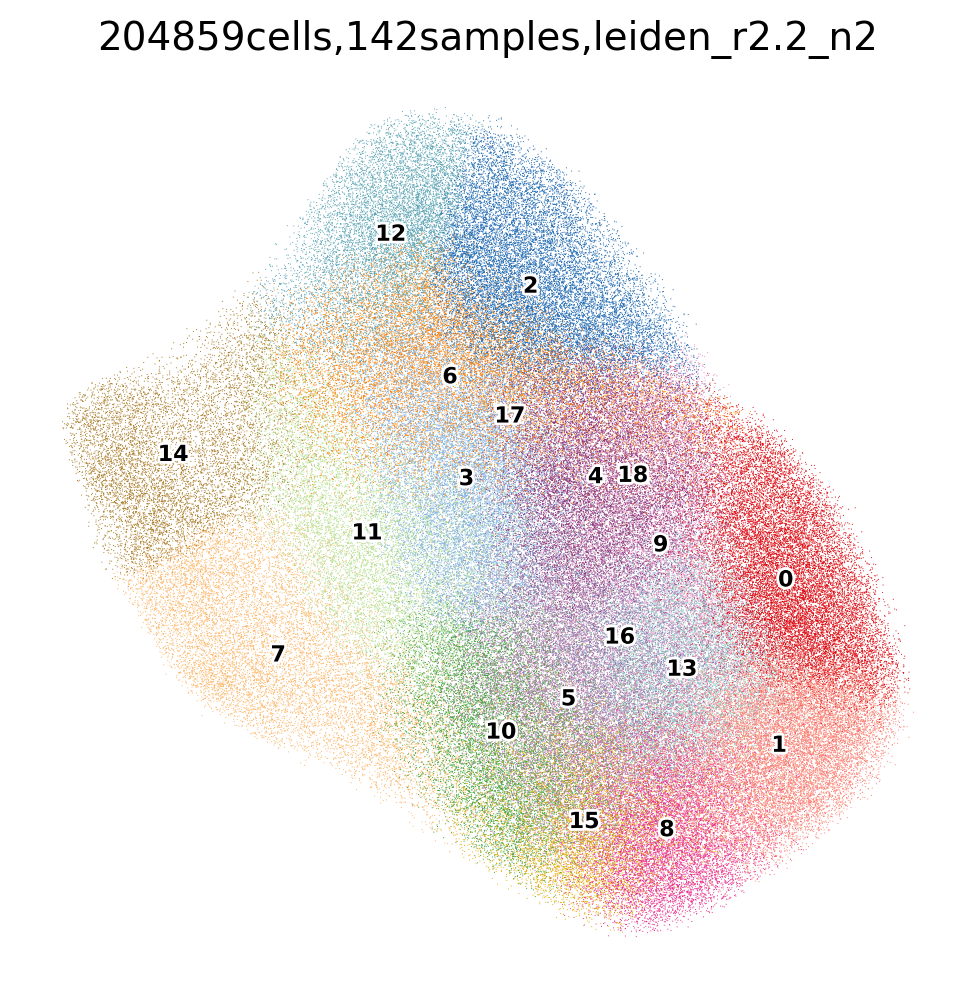

In [30]:
sc.tl.leiden(adata,resolution=2.2,n_iterations=2,key_added='leiden_r2.2_n2')
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['leiden_r2.2_n2'],legend_fontsize=8,legend_fontoutline=2,
               palette=cluster_cols,legend_loc="on data",title='204859cells,142samples,leiden_r2.2_n2')

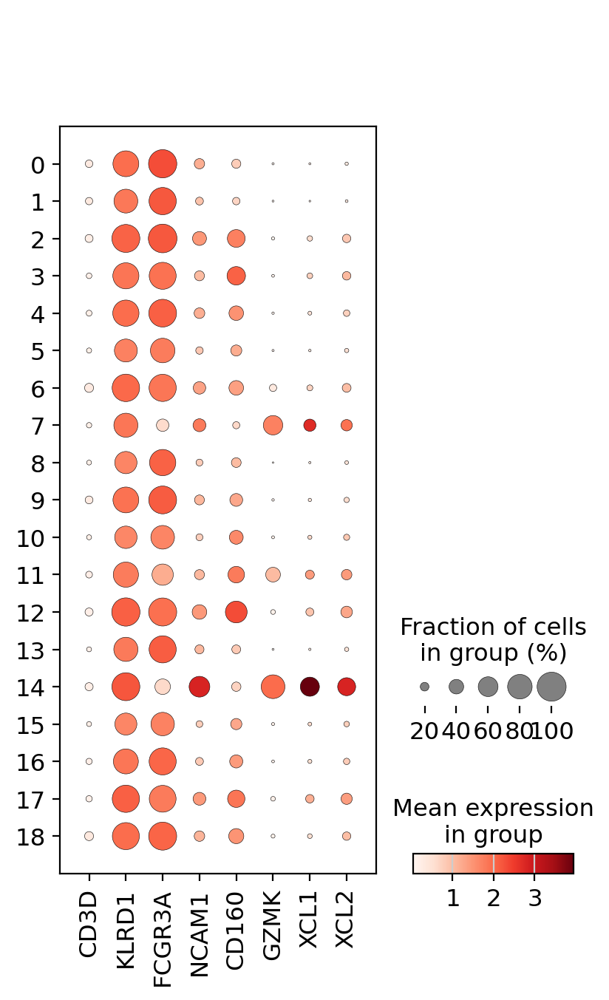

In [32]:
sc.pl.dotplot(adata, ["CD3D","KLRD1","FCGR3A","NCAM1","CD160","GZMK","XCL1","XCL2"], groupby='leiden_r2.2_n2')

### COSG

In [34]:
import cosg as cosg
import importlib
importlib.reload(cosg)

<module 'cosg' from '/home/yangshichen/mambaforge/envs/rsc/lib/python3.10/site-packages/cosg/__init__.py'>

In [35]:
cosg.cosg(adata,
    key_added='cosg',
    mu=1,
    n_genes_user=50,
    groupby='leiden_r2.2_n2')

**finished identifying marker genes by COSG**


In [36]:
colnames = ['names', 'scores']
test = [pd.DataFrame(adata.uns["cosg"][c]) for c in colnames]
test = pd.concat(test, axis=1, names=[None, 'group'], keys=colnames)

markers = {}
cats = adata.obs['leiden_r2.2_n2'].cat.categories
for i, c in enumerate(cats):
    cell_type_df = test.loc[:, 'names'][str(c)]
    scores_df = test.loc[:, 'scores'][str(c)]
    markers[str(c)] = cell_type_df.values.tolist()[:10]

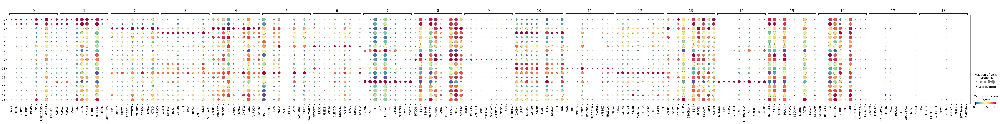

In [37]:
sc.pl.dotplot(adata, 
              var_names = markers, 
              groupby='leiden_r2.2_n2',
              cmap='Spectral_r',
              standard_scale='var',save='_filter_dotplot_leiden_r2.2_n2.pdf') 

In [38]:
marker_gene=pd.DataFrame(adata.uns['cosg']['names'])
marker_gene.head()

,0,1,10,11,12,13,14,15,16,17,18,2,3,4,5,6,7,8,9
0,LAG3,KLRC2,CXCR4,ITGA6,HELZ,CX3CR1,SPTSSB,TMSB4X,S100A8,XAGE3,RXFP4,IGFBP7,CREM,CX3CR1,MALAT1,SPOCK2,GZMK,PTGDS,S100B
1,RAP2A,KLRC3,JUNB,LDB2,CEP78,NDFIP2,IGFBP4,B2M,KBTBD3,TSPY10,H1FOO,APLP2,NR4A2,GIMAP7,POLR2J3,KLRG1,SELL,B2M,PTGDS
2,KLRC2,LAG3,DUSP1,PDE4B,UTRN,LGALS1,CAPG,ACTN1,B2M,KRTAP20-2,LACTBL1,PREX1,RGS1,SPON2,DIP2A,PDE3B,TPT1,S100B,ZNF683
3,LILRB1,IL32,ZFP36,PIK3R1,CD38,ACTB,GPR183,HLA-C,TMSB10,IFI44L,WFDC13,RASSF4,ZFP36,TXNIP,SYNE2,CD84,TCF7,TMSB4X,DGKK
4,PTMS,CCL5,CD69,PFKFB3,MAN1A2,DHCR24,COTL1,MNDA,KLRB1,MX1,PEX7,CCND3,CCL3,IGFBP7,ERV3-1,CLEC2D,EEF1A1,FGFBP2,COL13A1


In [39]:
marker_gene.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/NK/figures/_leiden_r2.2_n2_marker_gene.csv')

defaulting to using `.raw`
[W] [15:38:16.597424] L-BFGS: max iterations reached
[W] [15:38:16.601427] Maximum iterations reached before solver is converged. To increase model accuracy you can increase the number of iterations (max_iter) or improve the scaling of the input data.


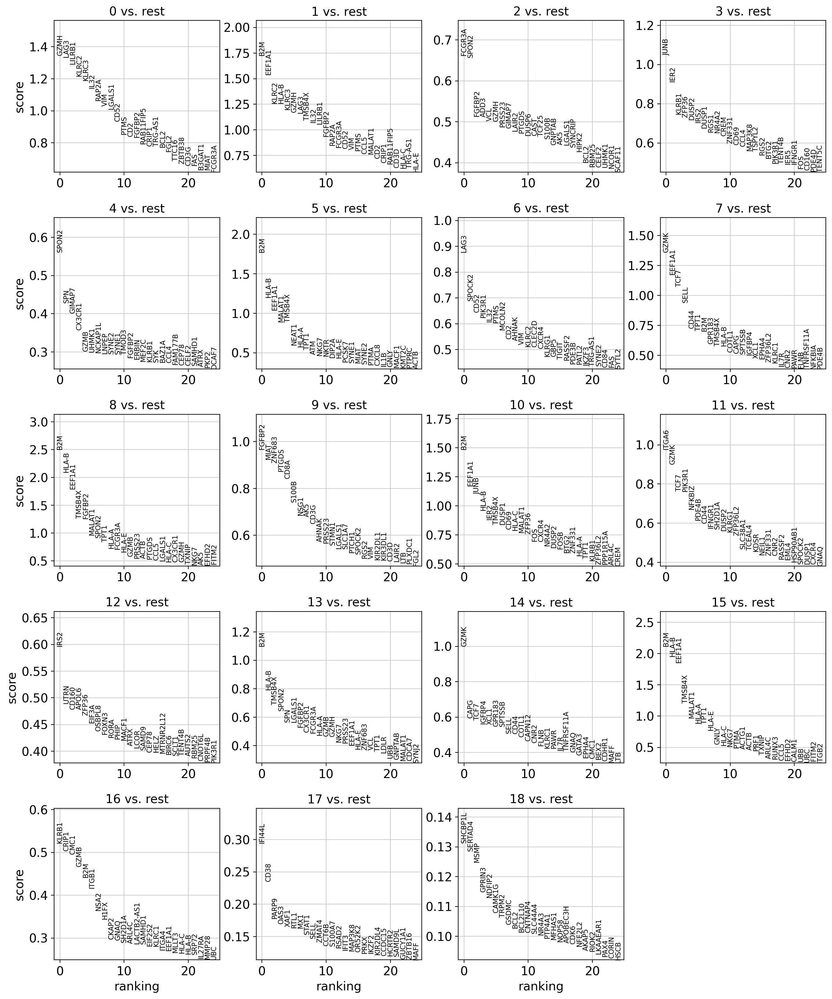

In [40]:
rsc.tl.rank_genes_groups_logreg(adata, "leiden_r2.2_n2")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

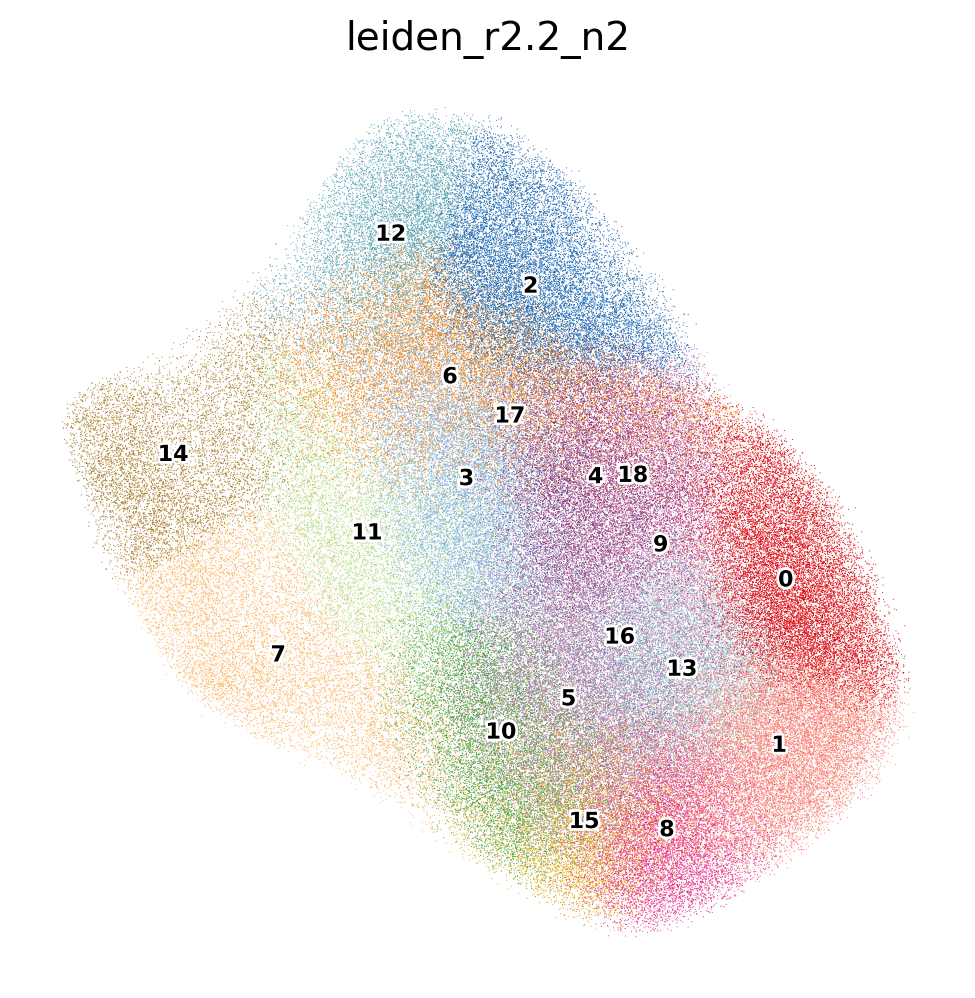

In [42]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata, color=['leiden_r2.2_n2'],legend_loc="on data",
               legend_fontsize=8, legend_fontoutline=2,palette=cluster_cols)

### 注释

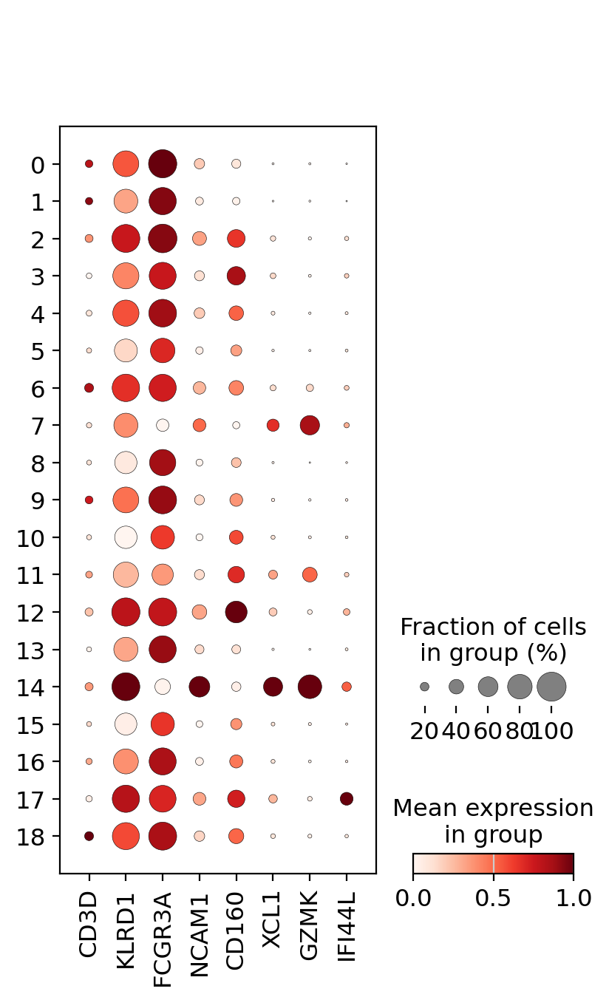

In [56]:
sc.pl.dotplot(adata, ["CD3D","KLRD1","FCGR3A","NCAM1","CD160","XCL1","GZMK","IFI44L"], groupby='leiden_r2.2_n2',
             standard_scale='var')

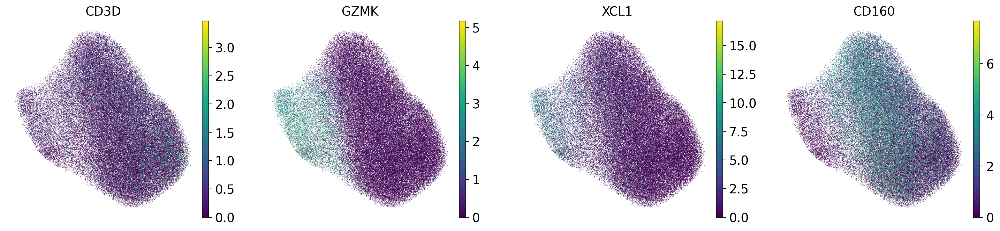

In [55]:
sc.pl.umap(adata, color=["CD3D","GZMK","XCL1",'CD160'])

In [79]:
adata.obs = adata.obs.drop(['celltype_L3'],axis=1)

In [82]:
new_cluster_names = ['Terminal_NK_dim-CD160neg','Terminal_NK_dim-CD160neg','Mature_NK_dim-FCGR3A',
                     'Mature_NK_dim-FCGR3A','Mature_NK_dim-FCGR3A','Mature_NK_dim-FCGR3A',
                     'Mature_NK_dim-FCGR3A','NK_bright-XCL1','Mature_NK_dim-FCGR3A','Mature_NK_dim-FCGR3A',
                     'Mature_NK_dim-FCGR3A','Transitional_NK-GZMK','Mature_NK_dim-FCGR3A',
                     'Terminal_NK_dim-CD160neg','NK_bright-XCL1','Mature_NK_dim-FCGR3A',
                     'Mature_NK_dim-FCGR3A','Inflamed_NK_dim-IFI44L','Mature_NK_dim-FCGR3A']
adata.obs['celltype_L3']=adata.obs['leiden_r2.2_n2'].replace(to_replace = list(adata.obs['leiden_r2.2_n2'].cat.categories.values),
                                                         value = new_cluster_names)

In [83]:
adata.obs['celltype_L3'].value_counts()

Mature_NK_dim-FCGR3A        130687
Terminal_NK_dim-CD160neg     43777
NK_bright-XCL1               20291
Transitional_NK-GZMK          9807
Inflamed_NK_dim-IFI44L         297
Name: celltype_L3, dtype: int64

In [84]:
phases = ["NK_bright-XCL1","Transitional_NK-GZMK",'Mature_NK_dim-FCGR3A','Terminal_NK_dim-CD160neg',
         'Inflamed_NK_dim-IFI44L']
adata.obs["phase_ordered"] = pd.Categorical(values=adata.obs.celltype_L3, categories=phases, ordered=True)

In [102]:
NK_colors={'NK_bright-XCL1':'#5A7585',
           'Transitional_NK-GZMK':'#787CA5',
           'Mature_NK_dim-FCGR3A':'#A89FB7',
           'Terminal_NK_dim-CD160neg':'#906A8C',
           'Inflamed_NK_dim-IFI44L':'#3C314B'

}

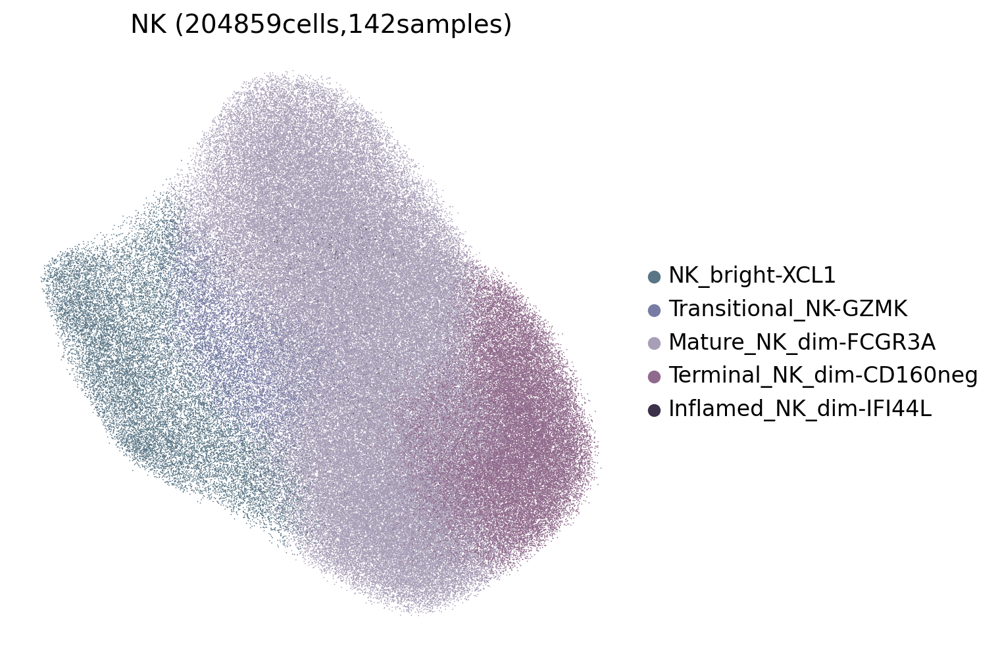

In [129]:
with rc_context({'figure.figsize': (6, 6)}):
    sc.pl.umap(adata,color=['phase_ordered'],legend_fontsize=12,size=1.5,legend_fontoutline=2,
               palette=NK_colors,title='NK (204859cells,142samples)',#legend_loc="on data",
               save='_NK_celltype_L3.pdf')

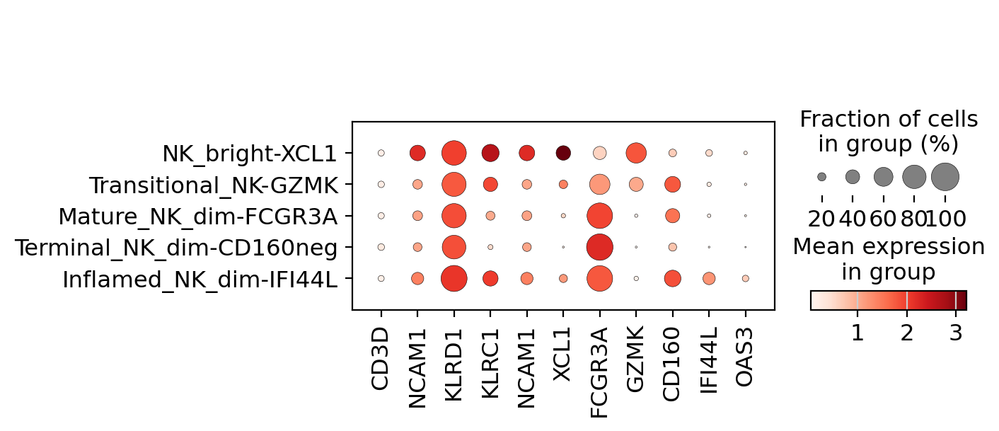

In [126]:
sc.pl.dotplot(adata, ["CD3D",'NCAM1',"KLRD1","KLRC1","NCAM1","XCL1",'FCGR3A',"GZMK","CD160","IFI44L","OAS3"], 
              categories_order=["NK_bright-XCL1","Transitional_NK-GZMK",'Mature_NK_dim-FCGR3A',
                                'Terminal_NK_dim-CD160neg','Inflamed_NK_dim-IFI44L'],#standard_scale='var',
              groupby='celltype_L3',save='celltype_L3.pdf')

In [130]:
adata.write('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/NK_celltype.h5ad')

### 细胞比例

In [131]:
# 计算每个样本中每种细胞类型的计数
cell_counts = adata.obs.groupby(['sample', 'celltype_L3']).size().reset_index(name='count')
# 计算每个样本中细胞类型的总计数
sample_totals = cell_counts.groupby('sample')['count'].sum().reset_index(name='total_count')
# 合并计数和总计数数据框
merged_data = pd.merge(cell_counts, sample_totals, on='sample')
# 计算每个样本中细胞类型的比例
merged_data['proportion'] = merged_data['count'] / merged_data['total_count']
# 输出结果
print(merged_data)
merged_data.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/NK/proportions_L3.csv', index=False)

      sample               celltype_L3  count  total_count  proportion
0    HD-H134  Terminal_NK_dim-CD160neg    724         2658    0.272385
1    HD-H134      Mature_NK_dim-FCGR3A   1472         2658    0.553800
2    HD-H134            NK_bright-XCL1    363         2658    0.136569
3    HD-H134      Transitional_NK-GZMK     96         2658    0.036117
4    HD-H134    Inflamed_NK_dim-IFI44L      3         2658    0.001129
..       ...                       ...    ...          ...         ...
705  PD-H308  Terminal_NK_dim-CD160neg    184          499    0.368737
706  PD-H308      Mature_NK_dim-FCGR3A    268          499    0.537074
707  PD-H308            NK_bright-XCL1     27          499    0.054108
708  PD-H308      Transitional_NK-GZMK     19          499    0.038076
709  PD-H308    Inflamed_NK_dim-IFI44L      1          499    0.002004

[710 rows x 5 columns]


### DEG

In [132]:
adata=sc.read("/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/HIV-pbmc2/NK_celltype.h5ad")
adata

AnnData object with n_obs × n_vars = 204859 × 21679
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'doublet', 'batch', 'sample', 'stage', 'experiments', 'age', 'total_counts_rp', 'pct_counts_rp', 'total_counts_hb', 'pct_counts_hb', 'total_counts_ncRNA', 'pct_counts_ncRNA', 'total_counts_LOC', 'pct_counts_LOC', 'total_counts_erccs', 'pct_counts_erccs', 'celltype_L1', 'phase_ordered', 'leiden_r2.2_n2', 'celltype_L3'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'mean', 'std'
    uns: 'age_colors', 'cosg', 'experiments_colors', 'hvg', 'leiden', 'leiden_r1.5_n2_colors', 'leiden_r1.8_n2_colors', 'leiden_r2.0_n2_colors', 'leiden_r2.2_n2_colors', 'log1p', 'neighbors', 'pca', 'phase_ordered_colors', 'rank_genes_groups', 'stage_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivitie

In [134]:
unique_celltypes = adata.obs['celltype_L3'].unique()
unique_celltypes

['NK_bright-XCL1', 'Mature_NK_dim-FCGR3A', 'Terminal_NK_dim-CD160neg', 'Transitional_NK-GZMK', 'Inflamed_NK_dim-IFI44L']
Categories (5, object): ['Terminal_NK_dim-CD160neg', 'Mature_NK_dim-FCGR3A', 'NK_bright-XCL1', 'Transitional_NK-GZMK', 'Inflamed_NK_dim-IFI44L']

In [135]:
for celltype in unique_celltypes:
    celltype_data = adata[adata.obs['celltype_L3'] == celltype, :]
    celltype_data.uns['log1p']['base']=None
    sc.tl.rank_genes_groups(celltype_data, groupby='stage',groups=['IRs','INRs'],reference='HDs',method='wilcoxon', key_added = "wilcoxon_HDs")
    sc.tl.rank_genes_groups(celltype_data, groupby='stage',groups=['INRs'],reference='IRs',method='wilcoxon', key_added = "wilcoxon_IRs")
    genes1 = sc.get.rank_genes_groups_df(celltype_data, group='IRs', key='wilcoxon_HDs')
    genes2 = sc.get.rank_genes_groups_df(celltype_data, group='INRs', key='wilcoxon_HDs')
    genes3 = sc.get.rank_genes_groups_df(celltype_data, group='INRs', key='wilcoxon_IRs')
    genes1.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/NK/DEG/{}_IRs_vs_HDs.csv'.format(celltype), index=False)
    genes2.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/NK/DEG/{}_INRs_vs_HDs.csv'.format(celltype), index=False)
    genes3.to_csv('/media/AnalysisDisk1/Yanshichen/0_HIV_RNA/Subcelltype/NK/DEG/{}_INRs_vs_IRs.csv'.format(celltype), index=False)

ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:48)
ranking genes
    finished: added to `.uns['wilcoxon_IRs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:20)
ranking genes
    finished: added to `.uns['wilcoxon_HDs']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group